# Brexit: What divided Britain? #
<br>
<br>

<div class="inline-block"> <img src="https://keyassets.timeincuk.net/inspirewp/live/wp-content/uploads/sites/34/2017/01/brexit-wine-flags.jpg" style="width: 400px;"/> </div> 

**Author: Harry Bell**

**Email: [hjb328@stern.nyu.edu](hjb328@stern.nyu.edu)**

**Introduction**

On the 23rd June 2016, the United Kindgom voted to leave the European Union. It was a result that was completely unexpected and illustrated how divide Britain had become. The brexit debate centered around immigration and the economy. After the result, pro-remain voters adamantly believed that the country had chosen to leave due to immigration fears. It was perceived that xenophobia was the main factor in the result. 

In this report I analyze immigration, lifestyle, and economic data by Constituency to determine the main factors in the Brexit Vote.

My report will be broken into four sections:

-  Data Report
-  Description of packages used
-  Analysis of data
-  Conclusion 


### Data Report ####


My data for this project came from the [UK 2011 Census](https://www.ons.gov.uk/census/2011census). The census provides very detailed information about UK citizens and is displayed via numerous regional breakdowns. For my report, I used data gathered by 2010 parlimentary constituencies to ensure consistency, and to allow for accurate comparison of information. With 650 constituencies in the UK, the information gathered can show trends and patterns. 

All my data is saved as .csv files. The datasets are stored in my github repository and are imported via url. I used pd.read_csv(url) to import all the datasets. 

To allow for easy comparison, I created a master Dataframe to store all the data I wanted to analyze. When I imported the individual datasets, I took the keys I needed to analyze and copied them into the masterDf. The masterDf is ordered alphabetically by constituency to ensure that all the copied cells are matched to the correct constituency. 



### Packages ###

My packages are as follows:

-  **pandas**: Used to import, store, and alter data
-  **matplotlib**: Used to plot data onto graphs
-  **matplotlib.pyplot**: Create lines of best fit for graphs
-  **numpy**: Transformation of data

In [710]:
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

### Brexit Vote Results ###

In [711]:
# Import Data on voting results 
euVoteDf = pd.read_csv("https://raw.githubusercontent.com/harryb328/Data_Bootcamp_Final_Project/master/eureferendum_constitunecy.csv")

# Set Index
euVoteDf = euVoteDf.set_index(["ONS ID"])

#Order alphabetically by constituency 
euVoteDf = euVoteDf.sort_values(by='Constituency', ascending=True)

In [712]:
#Permantly delete column
del euVoteDf['estimate']

In [713]:
#Permantly delete column
del euVoteDf['result']

In [714]:
#Permantly delete column
del euVoteDf['leave']

In [715]:
#Rename column
euVoteDf=euVoteDf.rename(columns = {'FIGURE TO USE':'Pct_leave'})

#Display
euVoteDf.head()

,Constituency,Pct_leave
ONS ID,,
W07000049,Aberavon,0.601
W07000058,Aberconwy,0.522
S14000001,Aberdeen North,0.431
S14000002,Aberdeen South,0.321
S14000003,Airdrie and Shotts,0.398


### Demographics  by Ethnicity###

In [716]:
# Import Data on ethnic demographics 
urlEthnicGroup = "https://raw.githubusercontent.com/harryb328/Data_Bootcamp_Final_Project/master/Ethnic%20Group%20By%20Constituency%20.csv"
ethnicGroupDf = pd.read_csv(urlEthnicGroup)

#Display first 5 rows
ethnicGroupDf.head()

,date,geography,geography code,Ethnic Group: All categories: Ethnic group; measures: Value,Ethnic Group: White; measures: Value,Ethnic Group: Gypsy / Traveller / Irish Traveller; measures: Value,Ethnic Group: Mixed / Multiple ethnic group; measures: Value,Ethnic Group: Asian / Asian British: Indian; measures: Value,Ethnic Group: Asian / Asian British: Pakistani; measures: Value,Ethnic Group: Asian / Asian British: Bangladeshi; measures: Value,Ethnic Group: Asian / Asian British: Chinese; measures: Value,Ethnic Group: Asian / Asian British: Other Asian; measures: Value,Ethnic Group: Black / African / Caribbean / Black British; measures: Value,Ethnic Group: Other Ethnic Group; measures: Value,Ethnic Group: Non White,Percentage of non-Whites
0,2011,Berwick-upon-Tweed,E14000554,75718,74648,50,373,131,64,40,102,109,141,60,1070,0.014
1,2011,Bishop Auckland,E14000569,87143,85935,123,461,147,62,21,117,108,93,76,1208,0.014
2,2011,Blaydon,E14000574,88281,86665,27,504,245,130,31,195,172,160,152,1616,0.018
3,2011,Blyth Valley,E14000575,82174,81061,10,442,199,54,85,115,117,47,44,1113,0.014
4,2011,City of Durham,E14000641,94375,90029,106,994,616,171,69,957,603,337,493,4346,0.046


In [717]:
# Rename colunms to more simple names
ethnicGroupDf=ethnicGroupDf.rename(columns = {'Ethnic Group: All categories: Ethnic group; measures: Value':'Total_Population'})

#Create new dataframe with specfic columns from ethnicGroupDf
ethnicNonWhiteDf = ethnicGroupDf[['geography code','geography','Total_Population','Ethnic Group: Non White', "Percentage of non-Whites"]].copy()

#Set index
ethnicNonWhiteDf = ethnicNonWhiteDf.set_index(['geography code'])

#Order alphabetically by constituency 
ethnicNonWhiteDf = ethnicNonWhiteDf.sort_values(by='geography', ascending=True)

#Display
ethnicNonWhiteDf.head()

,geography,Total_Population,Ethnic Group: Non White,Percentage of non-Whites
geography code,,,,
W07000049,Aberavon,66133,1684,0.025
W07000058,Aberconwy,56415,1245,0.022
S14000001,Aberdeen North,99654,9940,0.100
S14000002,Aberdeen South,93197,7018,0.075
S14000003,Airdrie and Shotts,85845,1400,0.016


### Create Master Dataframe ###

In [718]:
# Create masterDf by joing existing dataframes
#Use this dataframe for the project to store information 
masterDf = euVoteDf.join(ethnicNonWhiteDf)

In [719]:
#Delete replicated geography column
del masterDf['geography']

In [720]:
#Rename column
masterDf=masterDf.rename(columns = {'Percentage of non-Whites':'Pct_non_whites'})

In [721]:
#Create column to display whether a constituency voted majority remain or leave
# Leave is stored as 1 and remain is stored as 0

# list to store data
l =[]

#loop through all rows in percentage leave column 
for x in masterDf["Pct_leave"] :
    
    #if the pct_leave greater than 0.5 then constituency voted to leave: stored as 1
    if x > 0.50:
        
        #add to list l
        l.append(1)
        
    #if the pct_leave less than 0.5 then constituency voted to remain: stored as 0
    else:
        
        #add to list l
        l.append(0)

#Create column in masterDf using data stored in list l
masterDf["leave"] = l

In [722]:
#Create column to show which constituencies are in london
masterDf["London"] = 0

#Constuencies in London
x = ['E14000540',
'E14000549',
'E14000551',
'E14000553',
'E14000555',
'E14000558',
'E14000591',
'E14000592',
'E14000593',
'E14000604',
'E14000615',
'E14000621',
'E14000629',
'E14000634',
'E14000636',
'E14000639',
'E14000654',
'E14000655',
'E14000656',
'E14000657',
'E14000673',
'E14000674',
'E14000675',
'E14000676',
'E14000679',
'E14000687',
'E14000690',
'E14000691',
'E14000692',
'E14000696',
'E14000701',
'E14000703',
'E14000718',
'E14000720',
'E14000721',
'E14000726',
'E14000727',
'E14000731',
'E14000732',
'E14000737',
'E14000741',
'E14000750',
'E14000751',
'E14000752',
'E14000759',
'E14000760',
'E14000763',
'E14000764',
'E14000768',
'E14000770',
'E14000787',
'E14000788',
'E14000789',
'E14000790',
'E14000823',
'E14000869',
'E14000872',
'E14000882',
'E14000887',
'E14000896',
'E14000900',
'E14000906',
'E14000978',
'E14000984',
'E14000998',
'E14001002',
'E14001005',
'E14001007',
'E14001008',
'E14001013',
'E14001032',
'E14001036',
'E14001040']

#Loop through each row in the master dataframe
for i in x:
    
    #If index in list above is found change London value to 1
    masterDf.loc[i,"London"] = 1

#Display
masterDf.tail()

,Constituency,Pct_leave,Total_Population,Ethnic Group: Non White,Pct_non_whites,leave,London
ONS ID,,,,,,,
E14001059,Wythenshawe and Sale East,0.496,105438,13614,0.129,0,0
E14001060,Yeovil,0.599,106783,2393,0.022,1,0
W07000041,Ynys Mon,0.509,69751,1296,0.019,1,0
E14001061,York Central,0.388,104359,7773,0.074,0,0
E14001062,York Outer,0.447,93692,3816,0.041,0,0


### Demographics Analysis ###

In this first analyiss, I will look at ethnic diversity in each constituency and the number of foreign born individuals. I will use a scatter plot to plot each constituencies result against its own leave vote. 

My hypothesis is that actual immigration numbers had little to no effect on the vote.

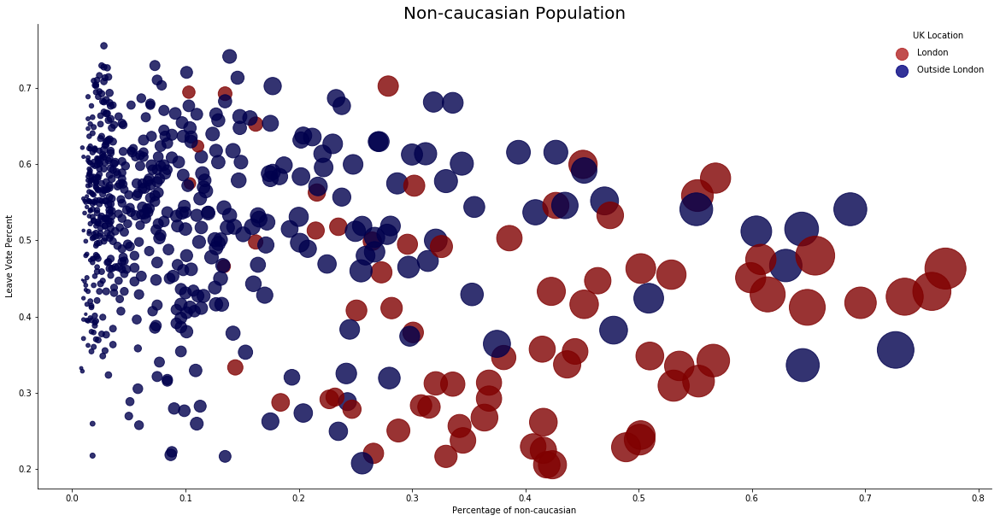

In [723]:
# Create figure
fig, ax = plt.subplots(figsize = (20,10))

# Custom legend for dot color
for area in ["l", "n"]:
    
    #for london dot
    if area =="l":
        
        #create london dot for legend
        ax.scatter([], [], c='firebrick', alpha=0.8, s=200,
                    label= "London")
        
    #for outside london
    else:
        
        #create outside lonodon dot
        ax.scatter([], [], c='navy', alpha=0.8, s=200,
                label= "Outside London")
        
#Create legend
ax.legend(frameon=False, labelspacing=1, title='UK Location')

#Size of each dot determined by absolute number of non-caucasians in each area
size = masterDf['Ethnic Group: Non White']/50

#Different color for in and outside london
color = masterDf['London']

#color map
cmap = "seismic"

#Create Scatter plot
ax.scatter(masterDf['Pct_non_whites'], masterDf['Pct_leave'],s = size, c = color ,alpha = 0.8, cmap = cmap)

#Labels 
ax.set_title("Non-caucasian Population", fontsize = 20)
ax.set_ylabel("Leave Vote Percent", fontsize = 10)
ax.set_xlabel("Percentage of non-caucasian", fontsize = 10)


#Remove Spines
ax.spines["right"].set_visible(False) 
ax.spines["top"].set_visible(False) 



The graph shows the the non-caucasian population is concentrated in certain areas. The reds dots show regions in london, while Blue is outside london. This shows that most of the non-caucasian population is in London. For the rest of the demographics analyis I will remove London constituencies to focus on the outer areas 

In [724]:
#Excluded London from dataset 
x = masterDf.loc[masterDf['London'] == 0, 'Pct_non_whites']
y = masterDf.loc[masterDf['London'] == 0, 'Pct_leave']
z = masterDf.loc[masterDf['London'] == 0, 'leave']

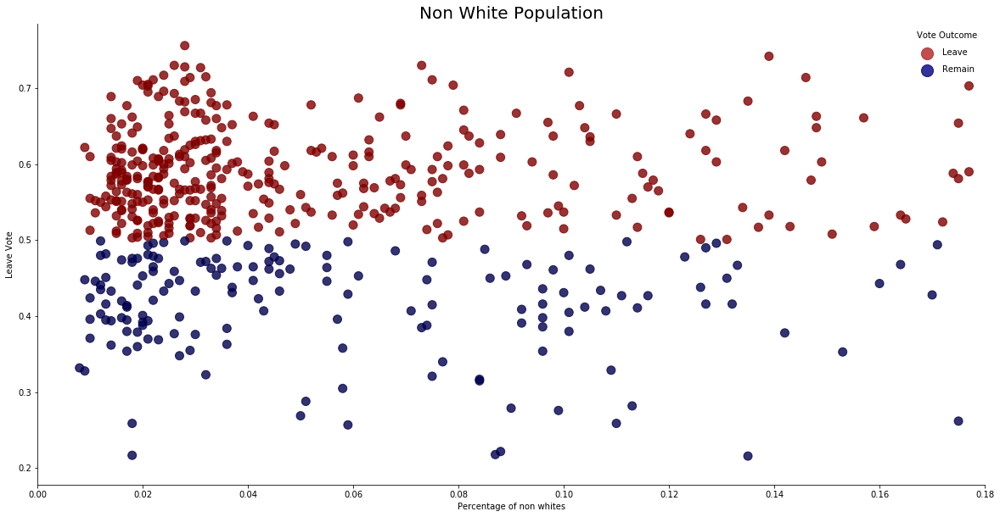

In [725]:
# Create figure
fig, ax = plt.subplots(figsize = (20,10))

# Custom legend for dot color
for area in ["l", "r"]:
    
    #for leave dot
    if area =="l":
        
        #Create leave dot
        ax.scatter([], [], c='firebrick', alpha=0.8, s=200,
                    label= "Leave")
    
    #for remain dot
    else:
        
        #Create remain dot
        ax.scatter([], [], c='navy', alpha=0.8, s=200,
                label= "Remain")  

#Create legend
ax.legend(frameon=False, labelspacing=1, title='Vote Outcome')

#color for leave and remain
color = z

#Color map
cmap = "seismic"

#Create scatter plot
ax.scatter(x, y,s = 100, c = color ,alpha = 0.8, cmap = cmap)

#Create Labels
ax.set_title("Non White Population", fontsize = 20)
ax.set_ylabel("Leave Vote", fontsize = 10)
ax.set_xlabel("Percentage of non whites", fontsize = 10)

#x axis limit to 18%
ax.set_xlim(0,0.18)

#Remove Spines
ax.spines["right"].set_visible(False) 
ax.spines["top"].set_visible(False) 

Areas that are overwhelmingly white (> 82%) still mostly voted to leave the EU. The number of non-white residents had little effect on the vote, there is no real correlation. 

#### UK Migration ####

In [726]:
#Import data
countryBirthUrl ="https://raw.githubusercontent.com/harryb328/Data_Bootcamp_Final_Project/master/Country_of_birth_by_constituency.csv"
countryBirthDf = pd.read_csv(countryBirthUrl)

#Set index and order
countryBirthDf = countryBirthDf.sort_values(by='geography', ascending=True)
countryBirthDf = countryBirthDf.set_index(['geography code'])

#Display
countryBirthDf.head()

,geography,Total,UK,Ireland,Europe,EU (ex.Ireland),Germany,Lithuania,Poland,Romania,Africa,Middle East and Asia
geography code,,,,,,,,,,,,
W07000049,Aberavon,66133,64237,244,587,536,157,2,132,12,185,649
W07000058,Aberconwy,56415,53839,418,1050,969,166,15,333,29,270,499
S14000001,Aberdeen North,99654,80833,598,8939,8321,818,545,4037,167,3007,4727
S14000002,Aberdeen South,93197,78570,718,6069,5445,551,256,2140,116,2277,3511
S14000003,Airdrie and Shotts,85845,83605,136,1092,1059,121,17,702,5,213,530


In [727]:
#Add percentages for different regions to the master dataframe
for x in countryBirthDf:
    if x != "geography":
        y = "Pct_" + x
        masterDf[y] = countryBirthDf[x]/countryBirthDf["Total"]
masterDf.head()

,Constituency,Pct_leave,Total_Population,Ethnic Group: Non White,Pct_non_whites,leave,London,Pct_Total,Pct_UK,Pct_Ireland,Pct_Europe,Pct_EU (ex.Ireland),Pct_Germany,Pct_Lithuania,Pct_Poland,Pct_Romania,Pct_Africa,Pct_Middle East and Asia
ONS ID,,,,,,,,,,,,,,,,,,
W07000049,Aberavon,0.601,66133,1684,0.025,1,0,1.0,0.971331,0.003690,0.008876,0.008105,0.002374,0.000030,0.001996,0.000181,0.002797,0.009814
W07000058,Aberconwy,0.522,56415,1245,0.022,1,0,1.0,0.954338,0.007409,0.018612,0.017176,0.002942,0.000266,0.005903,0.000514,0.004786,0.008845
S14000001,Aberdeen North,0.431,99654,9940,0.100,0,0,1.0,0.811137,0.006001,0.089700,0.083499,0.008208,0.005469,0.040510,0.001676,0.030174,0.047434
S14000002,Aberdeen South,0.321,93197,7018,0.075,0,0,1.0,0.843053,0.007704,0.065120,0.058425,0.005912,0.002747,0.022962,0.001245,0.024432,0.037673
S14000003,Airdrie and Shotts,0.398,85845,1400,0.016,0,0,1.0,0.973906,0.001584,0.012721,0.012336,0.001410,0.000198,0.008178,0.000058,0.002481,0.006174


In [728]:
#Excluded london locations
w = masterDf.loc[masterDf['London'] == 0, 'Pct_EU (ex.Ireland)']
x = masterDf.loc[masterDf['London'] == 0, 'Pct_Africa']
y = masterDf.loc[masterDf['London'] == 0, 'Pct_Middle East and Asia']
z = masterDf.loc[masterDf['London'] == 0, 'Pct_Europe']
l = masterDf.loc[masterDf['London'] == 0, 'Pct_leave']

In [729]:
#Create figure
fig, ax = plt.subplots(nrows = 2, ncols = 2, sharex = True, figsize = (200,150)) 

#4 by 1 array
ax = ax.ravel() 

#List of data to plot
var_list = [w,x,y,z]
name = ["EU Migration", "African Migration", "Asian Migration", "Europe (total) Migration"]
xaxis = ["EU Born","African Born", 'Asian Born', "European Born"]


#Iteration count
count = 0

for data in ax:
    
    
   
    #Create scatter plots
    data.scatter(var_list[count],l, alpha = 0.50, s = 3200, c ='navy') # Scatter plot
    
      
    #remove spines
    data.spines["right"].set_visible(False) 
    data.spines["top"].set_visible(False) 
    
    #labels
    data.set_title(name[count], fontsize = 120)
    data.set_ylabel("Percent Leave Vote", fontsize = 96) 
    data.set_xlabel("percent of " + xaxis[count], fontsize = 96)
    
    #set axis limits
    data.set_xlim(0,0.1)  
    data.set_ylim(0,1) 
    
    #tick size
    data.tick_params(axis = 'both', which = 'major', labelsize = 96)
  
    #increase count
    count = count + 1
    
#title
fig.suptitle("EU Migration", fontsize = 144, fontweight = "bold") 



Text(0.5,0.98,'EU Migration')

This shows that there is no correlation between the number of people born in foreign countries and the vote in that constituency. Most areas have a small percentage of foreign born citizens and yet still voted to leave the EU

In [730]:
#Exclude London
x = masterDf.loc[masterDf['London'] == 0, 'Pct_Germany']
y = masterDf.loc[masterDf['London'] == 0, 'Pct_Poland']
l = masterDf.loc[masterDf['London'] == 0, 'Pct_leave']

In [731]:
#Create figure
fig, ax = plt.subplots(ncols = 2, sharex = True, figsize = (300,100)) 


#Datasets      
var_list = [x,y]
title_name = ["UK German Population", "UK Polish Population"]
x_name = ["Percentage of Germans","Percentage of Polish"]



#Iteration Count
count = 0

for data in ax:
    
    #Create scatter plots
    data.scatter(var_list[count],l, color = "navy",alpha = 0.80, s = 3200) 
    
    #Remove spines
    data.spines["right"].set_visible(False) 
    data.spines["top"].set_visible(False) 
    
    #Set labels
    data.set_ylabel("Leave Vote Percent", fontsize = 140) 
    data.set_title(title_name[count], fontsize = 160)
    data.set_xlabel("percent of " + x_name[count], fontsize = 140)
    
    #Limits
    data.set_xlim(0,0.05)  
    data.set_ylim(0,1) 
    
    #tick size
    data.tick_params(axis = 'both', which = 'major', labelsize = 120)
    
    #count increase 
    count = count + 1 

#title
fig.suptitle("EU Migration", fontsize = 144, fontweight = "bold") # big titel

Text(0.5,0.98,'EU Migration')

### Economic and Social Analysis ###

**Employment By Industry**

In [732]:
# Import data
industryUrl ="https://raw.githubusercontent.com/harryb328/Data_Bootcamp_Final_Project/master/Industry%20by%20Constituency.csv"
industryDf = pd.read_csv(industryUrl)

# Create new dataframe from useful columns in industryDf
industrySectorDf = industryDf[["geography code","geography","Pct_primary ","Pct_manufactoring ","Pct_M.tech","Pct_utilities","Pct_construction","Pct_L_Services","Pct_H_Services","Pct_Govt","Pct_Arts","Pct_Other"]]

# Set index
industrySectorDf = industrySectorDf.set_index(["geography code"])

In [733]:
#Consolidate maunfacuring sectors into one 
industrySectorDf['Pct_Manufacture'] = industrySectorDf['Pct_manufactoring '] + industrySectorDf['Pct_M.tech'] + industrySectorDf["Pct_utilities"]+industrySectorDf["Pct_construction"]

In [734]:
#Consolidate service sectors 
industrySectorDf["Pct_service"] = 1 - industrySectorDf["Pct_primary "] - industrySectorDf["Pct_Manufacture"]

In [735]:
#Place column in master
masterDf["Pct_primary"] = industrySectorDf["Pct_primary "]

In [736]:
#Place column in master
masterDf["Pct_manufacturing"] = industrySectorDf["Pct_Manufacture"]

In [737]:
#Place column in master
masterDf["Pct_service"] = industrySectorDf["Pct_service"]

#Display
masterDf.head()

,Constituency,Pct_leave,Total_Population,Ethnic Group: Non White,Pct_non_whites,leave,London,Pct_Total,Pct_UK,Pct_Ireland,...,Pct_EU (ex.Ireland),Pct_Germany,Pct_Lithuania,Pct_Poland,Pct_Romania,Pct_Africa,Pct_Middle East and Asia,Pct_primary,Pct_manufacturing,Pct_service
ONS ID,,,,,,,,,,,,,,,,,,,,,
W07000049,Aberavon,0.601,66133,1684,0.025,1,0,1.0,0.971331,0.003690,...,0.008105,0.002374,0.000030,0.001996,0.000181,0.002797,0.009814,0.005993,0.447846,0.546161
W07000058,Aberconwy,0.522,56415,1245,0.022,1,0,1.0,0.954338,0.007409,...,0.017176,0.002942,0.000266,0.005903,0.000514,0.004786,0.008845,0.019809,0.183233,0.796958
S14000001,Aberdeen North,0.431,99654,9940,0.100,0,0,1.0,0.811137,0.006001,...,0.083499,0.008208,0.005469,0.040510,0.001676,0.030174,0.047434,0.068415,0.203327,0.728258
S14000002,Aberdeen South,0.321,93197,7018,0.075,0,0,1.0,0.843053,0.007704,...,0.058425,0.005912,0.002747,0.022962,0.001245,0.024432,0.037673,0.113925,0.195302,0.690773
S14000003,Airdrie and Shotts,0.398,85845,1400,0.016,0,0,1.0,0.973906,0.001584,...,0.012336,0.001410,0.000198,0.008178,0.000058,0.002481,0.006174,0.008679,0.338438,0.652883


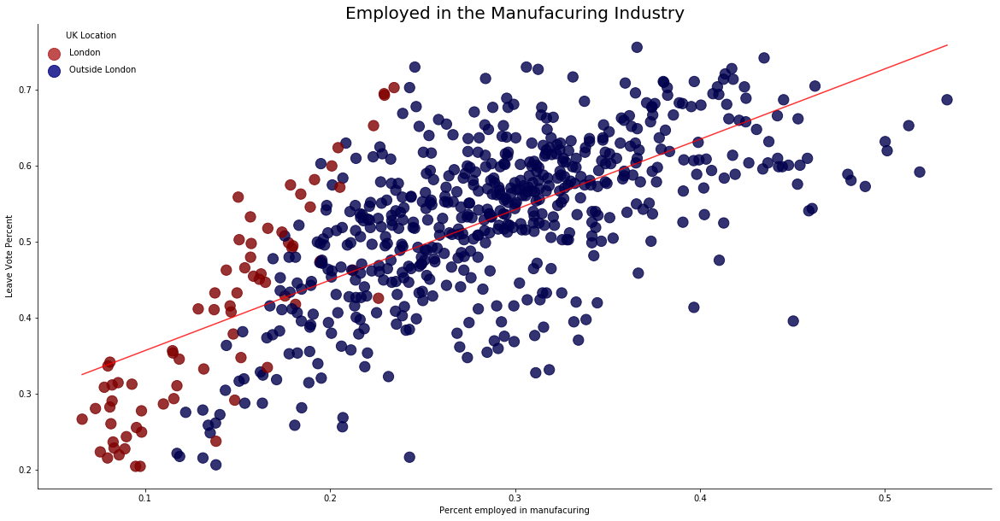

In [738]:
fig, ax = plt.subplots(figsize = (20,10))


#Custom legend
for area in ["l", "n"]:
    if area =="l":
        ax.scatter([], [], c='firebrick', alpha=0.8, s=200,
                    label= "London")
    else:
        ax.scatter([], [], c='navy', alpha=0.8, s=200,
                label= "Outside London")      
ax.legend(frameon=False, labelspacing=1, title='UK Location')

#color and color map
color = masterDf['London']
cmap = "seismic"

#Create Scatter
ax.scatter(masterDf['Pct_manufacturing'], masterDf['Pct_leave'],s = 150, alpha = 0.8, c = color, cmap = cmap)

#Remove spines
ax.spines["right"].set_visible(False) 
ax.spines["top"].set_visible(False) 

#Labels
ax.set_title("Employed in the Manufacuring Industry", fontsize = 20)
ax.set_ylabel("Leave Vote Percent", fontsize = 10)
ax.set_xlabel("Percent employed in manufacuring", fontsize = 10)
ax.tick_params(axis = 'both', which = 'major', labelsize = 10)

#Line of best fit
x = masterDf['Pct_manufacturing']
y = masterDf['Pct_leave']
ax.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), c = "r",alpha = 0.8)

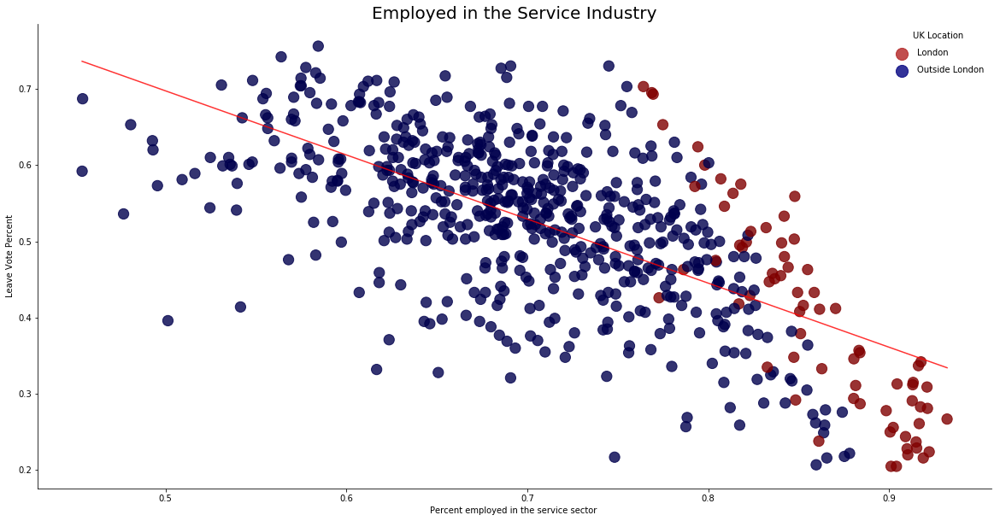

In [739]:
fig, ax = plt.subplots(figsize = (20,10))

for area in ["l", "n"]:
    if area =="l":
        ax.scatter([], [], c='firebrick', alpha=0.8, s=200,
                    label= "London")
    else:
        ax.scatter([], [], c='navy', alpha=0.8, s=200,
                label= "Outside London")      
ax.legend(frameon=False, labelspacing=1, title='UK Location')


color = masterDf['London']
cmap = "seismic"


ax.scatter(masterDf['Pct_service'], masterDf['Pct_leave'],s = 150, alpha = 0.8, c = color, cmap = cmap)


ax.spines["right"].set_visible(False) # remove the top and right spines
    
ax.spines["top"].set_visible(False) # Same as above
ax.set_title("Employed in the Service Industry", fontsize = 20)
ax.set_ylabel("Leave Vote Percent", fontsize = 10)
ax.set_xlabel("Percent employed in the service sector ", fontsize = 10)
ax.tick_params(axis = 'both', which = 'major', labelsize = 10)

x = masterDf['Pct_service']
y = masterDf['Pct_leave']

ax.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), c = "r",alpha = 0.8)


There is a strong correlation between the dominating industry in an area and voting result. Those areas with higher manufacturing had a higher leave vote percentage. Manufacturing jobs generally held by individuals from lower socio economic communites. What is particulary intriguing is that this replicated in London itself. Areas in London (red dots) with more manufacuring voted in favor of leaving EU. 

#### Education ####

In [740]:
# import
educationUrl ="https://raw.githubusercontent.com/harryb328/Data_Bootcamp_Final_Project/master/Qualifications_by_Constituency.csv"
educationDf = pd.read_csv(educationUrl)
eductionDf = educationDf.sort_values(by='geography', ascending=True)
educationDf = educationDf.set_index(['geography code'])
del educationDf['date']

In [741]:
educationDf.head()

,geography,Total,No qualifications,Level 1 qualifications,Level 2 qualifications,Level 3 qualifications,Level 4 qualifications
geography code,,,,,,,
E14000554,Berwick-upon-Tweed,63866,15354,8569,10599,7205,16547
E14000569,Bishop Auckland,72102,21622,9695,11612,8745,14414
E14000574,Blaydon,72958,18535,10316,11813,8577,16755
E14000575,Blyth Valley,67289,17260,10664,11868,8797,12565
E14000641,City of Durham,80604,16489,8481,10664,15920,23618


In [742]:
#Put percentages of data in master dataframe
for x in educationDf:
    if x != "geography":
        y = "Pct_" + x
        masterDf[y] = educationDf[x]/educationDf["Total"]

In [743]:
masterDf.head()

,Constituency,Pct_leave,Total_Population,Ethnic Group: Non White,Pct_non_whites,leave,London,Pct_Total,Pct_UK,Pct_Ireland,...,Pct_Africa,Pct_Middle East and Asia,Pct_primary,Pct_manufacturing,Pct_service,Pct_No qualifications,Pct_Level 1 qualifications,Pct_Level 2 qualifications,Pct_Level 3 qualifications,Pct_Level 4 qualifications
ONS ID,,,,,,,,,,,,,,,,,,,,,
W07000049,Aberavon,0.601,66133,1684,0.025,1,0,1.0,0.971331,0.003690,...,0.002797,0.009814,0.005993,0.447846,0.546161,0.329422,0.149744,0.157824,0.106477,0.166162
W07000058,Aberconwy,0.522,56415,1245,0.022,1,0,1.0,0.954338,0.007409,...,0.004786,0.008845,0.019809,0.183233,0.796958,0.236928,0.131256,0.163684,0.111376,0.271321
S14000001,Aberdeen North,0.431,99654,9940,0.100,0,0,1.0,0.811137,0.006001,...,0.030174,0.047434,0.068415,0.203327,0.728258,0.224587,0.228540,0.165692,0.091570,0.289610
S14000002,Aberdeen South,0.321,93197,7018,0.075,0,0,1.0,0.843053,0.007704,...,0.024432,0.037673,0.113925,0.195302,0.690773,0.170189,0.193673,0.134838,0.098344,0.402956
S14000003,Airdrie and Shotts,0.398,85845,1400,0.016,0,0,1.0,0.973906,0.001584,...,0.002481,0.006174,0.008679,0.338438,0.652883,0.360254,0.258224,0.128413,0.098255,0.154854


In [744]:
#Create figure
fig, ax = plt.subplots(nrows = 2, ncols = 2, sharex = True, figsize = (200,100)) 

#4 in 1
ax = ax.ravel() 

#dataset
var_list = ["Pct_No qualifications","Pct_Level 1 qualifications", "Pct_Level 2 qualifications", "Pct_Level 3 qualifications"]
name = ["No qualifications", "Level 1 qualifications", "Level 2 qualifications", "Level 3 qualifications"]

#Iteration
count = 0

#Loop through data
for data in ax:
    
    
    
    #Create scatter
    data.scatter(masterDf[var_list[count]],masterDf["Pct_leave"],color = 'navy', alpha = 0.80, s = 1600) # Scatter plot
    
    
     
    
    data.spines["right"].set_visible(False) 
    data.spines["top"].set_visible(False) 
    
    
    data.set_ylabel('Leave Vote Percent', fontsize = 96) 
    data.set_xlabel("Percent that have" + name[count], fontsize = 96)
    data.set_title(var_list[count], fontsize = 120)
    
    data.set_xlim(0,0.5)  
    data.set_ylim(0,1) 
    
    data.tick_params(axis = 'both', which = 'major', labelsize = 96)
    
    count = count + 1 
    
fig.suptitle("Education", fontsize = 144, fontweight = "bold") 


Text(0.5,0.98,'Education')

Looking at graphs, we see that there is a strong positive correlation. This suggests that idividuals with lower levels of education voted for Brexit. This could be because lower levels of education are linked with lower incomes. 

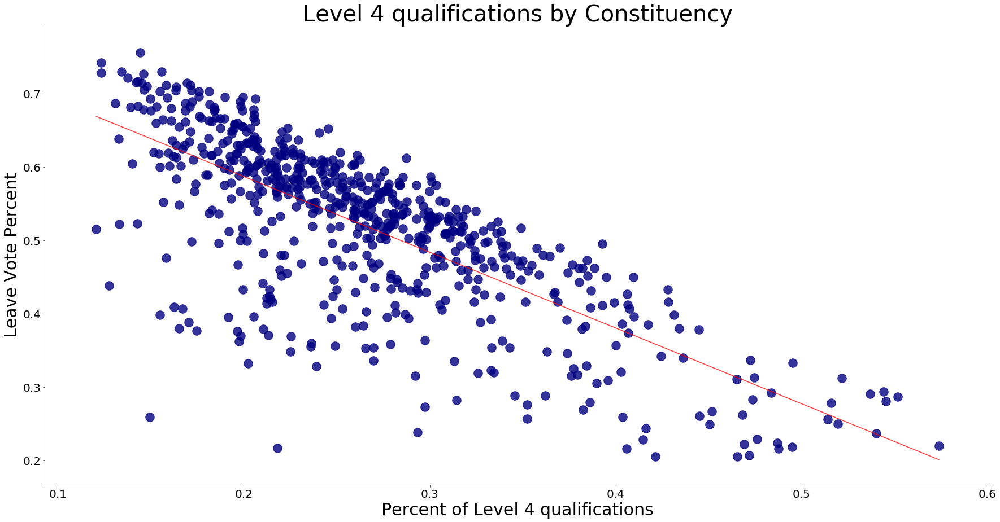

In [745]:
fig, ax = plt.subplots(figsize = (30,15))

ax.scatter(masterDf['Pct_Level 4 qualifications'], masterDf['Pct_leave'],s = 240, alpha = 0.8, color = 'navy')
ax.spines["right"].set_visible(False)
    
ax.spines["top"].set_visible(False) 
ax.set_title("Level 4 qualifications by Constituency", fontsize = 40)
ax.set_ylabel("Leave Vote Percent", fontsize = 30)
ax.set_xlabel("Percent of Level 4 qualifications", fontsize = 30)
ax.tick_params(axis = 'both', which = 'major', labelsize = 20)


x = masterDf['Pct_Level 4 qualifications']
y = masterDf['Pct_leave']
ax.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), c = "r",alpha = 0.8)

In contrast, those with the highest level of education had a negative correlation. The more educated an area is the less likely it was to vote for Brexit.

#### Unemployment ####

In [746]:
#import and set up
employmentUrl ="https://raw.githubusercontent.com/harryb328/databootcampproject/master/Employment_by_constituency%20.csv"
employmentDf = pd.read_csv(employmentUrl)
employmentDf = employmentDf.sort_values(by='geography', ascending=True)
employmentDf = employmentDf.set_index(['geography code'])

In [747]:
employmentDf.head()

,geography,Working Age Pop,Economically active,Employed,Unemployed,Full-time student,Never worked,Long-term unemployed
geography code,,,,,,,,
W07000049,Aberavon,48646,30113,26692,2335,1086,370,872
W07000058,Aberconwy,40443,27231,24464,1605,1162,178,647
S14000001,Aberdeen North,79096,55750,45268,2917,7565,355,1064
S14000002,Aberdeen South,72437,54458,48157,1992,4309,214,644
S14000003,Airdrie and Shotts,64143,43731,37841,4134,1756,633,1669


In [748]:
#Place percentage unemployed in master dataframe
masterDf["Pct_unemployed"] = employmentDf["Unemployed"]/employmentDf["Working Age Pop"]

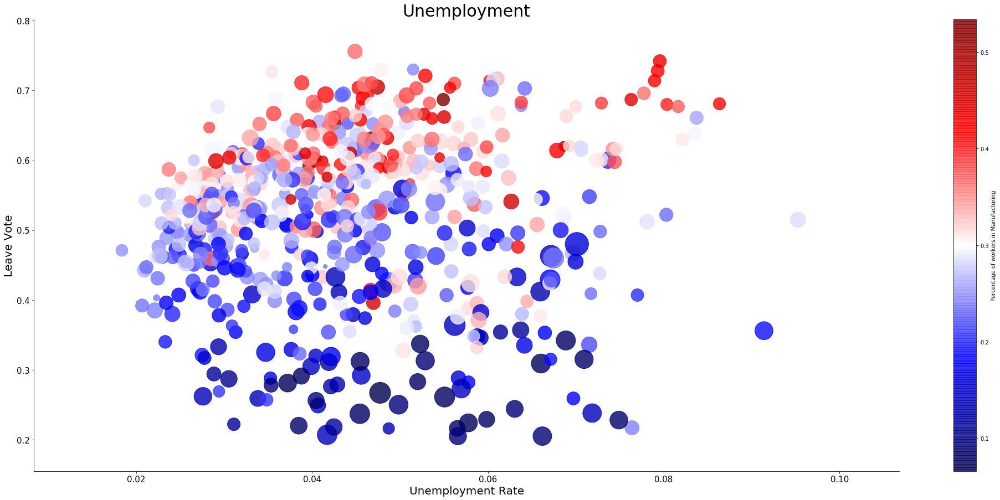

In [749]:
fig, ax = plt.subplots(figsize = (35,15))
color = masterDf['Pct_manufacturing']
cmap = "seismic"
artist = ax.scatter(masterDf['Pct_unemployed'], masterDf['Pct_leave'], c = color ,s = employmentDf['Working Age Pop']**2/8000000,alpha = 0.8, cmap = cmap)

ax.set_title("Unemployment", fontsize = 30)
ax.set_xlabel("Unemployment Rate", fontsize = 20)
ax.set_ylabel("Leave Vote", fontsize = 20)
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)

ax.spines["right"].set_visible(False) 
ax.spines["top"].set_visible(False) 

cbar = fig.colorbar(artist, label = "Percentage of workers in Manufacturing")


This shows that ther was no direct link between unemployment and the brexit vote. However, it does show that areas with high manfacturing unemployment were more likely to vote for brexit than areas with high service sectir unemployment. 

In [750]:
x = masterDf.loc[masterDf['Pct_manufacturing'] > 0.3, 'Pct_unemployed']
y = masterDf.loc[masterDf['Pct_manufacturing'] > 0.3, 'Pct_leave']
cl = masterDf.loc[masterDf['Pct_manufacturing'] > 0.3, 'Pct_manufacturing']

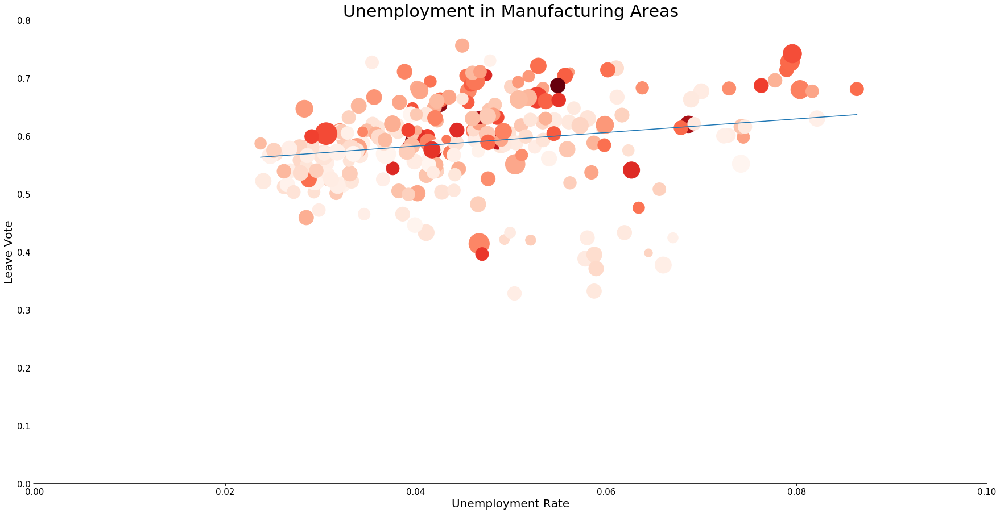

In [751]:
fig, ax = plt.subplots(figsize = (30,15))
color = cl
cmap = "Reds"
ax.scatter(x, y,c = color,s = employmentDf['Working Age Pop']**2/8000000,alpha = 1, cmap = cmap)
ax.spines["right"].set_visible(False) # remove the top and right spines
    
ax.spines["top"].set_visible(False) # Same as above

ax.set_title("Unemployment in Manufacturing Areas", fontsize = 30)
ax.set_xlabel("Unemployment Rate", fontsize = 20)
ax.set_ylabel("Leave Vote", fontsize = 20)
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)

ax.set_xlim(0,0.1) # 
ax.set_ylim(0,0.8)


ax.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)))





Looking solely at unemployment in areas with a high percentage of manufacturing, we see that there is a slight positive correclation. Thus, higher unemployment in these areas could have lead to more leave. 

In [752]:
#Exclude London
x = masterDf.loc[masterDf['London'] == 0, 'Pct_unemployed']
y = masterDf.loc[masterDf['London'] == 0, 'Pct_leave']
cl = masterDf.loc[masterDf['London'] == 0, 'Pct_manufacturing']
sl = employmentDf.loc[masterDf['London'] == 0, 'Working Age Pop']

**Unemployment (ex. London)**

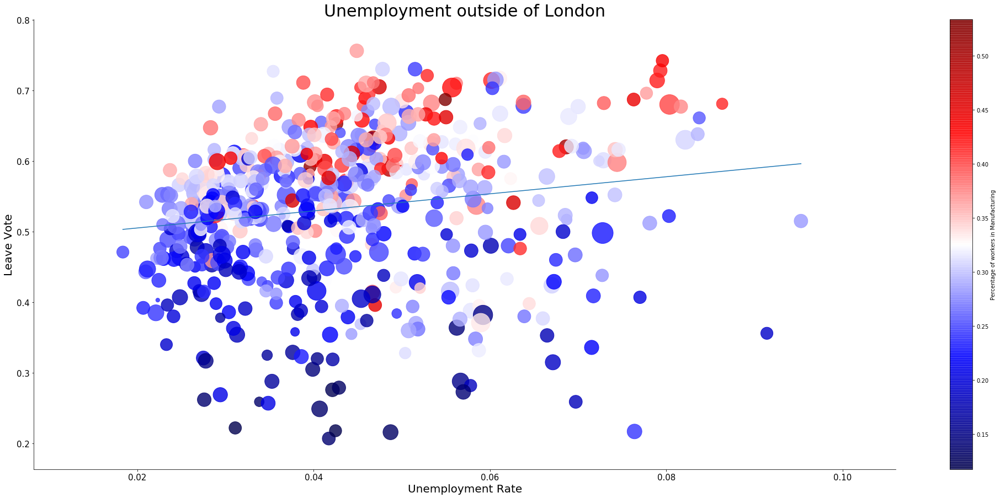

In [753]:
fig, ax = plt.subplots(figsize = (35,15))
color = cl
cmap = "seismic"
artist = ax.scatter(x, y, c = color ,s = employmentDf['Working Age Pop']**2/8000000,alpha = 0.8, cmap = cmap)

ax.set_title("Unemployment outside of London", fontsize = 30)
ax.set_xlabel("Unemployment Rate", fontsize = 20)
ax.set_ylabel("Leave Vote", fontsize = 20)
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)

ax.spines["right"].set_visible(False) 
ax.spines["top"].set_visible(False)

cbar = fig.colorbar(artist, label = "Percentage of workers in Manufacturing")

ax.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)))

Unemployment outside of London may have a larger effect than in London. It shows that there is a slight positive correrlation between leave votes and unemployment. Furthermore, as unemployemnt grows the dots become less concentrated. 

## Conclusion ##

The data shows that the number of immigrants in Britain did not have an affect on the vote, despite what people thought. Education levels and job sector had a much larger effect on the vote. It shows that lower socio economic areas predominantly voted for Brexit. Unemployment levels did not have a greater effect on the vote. However, outside of London there was a greater correlation.

After this analyze it seems that lower socio eonomic citizens were angered at the European Unions affect on the UK. They may have perceived immigration to be the problem even though it wasn't. 